<a href="https://colab.research.google.com/github/riza00/Riza-Umami_Juwels/blob/main/Riza_Umami_Juwels_Instance_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Download the source code
Download the source code of the ShapeMask model.

In [ ]:
!git clone -b shapemask https://github.com/tensorflow/tpu/

Cloning into 'tpu'...
remote: Enumerating objects: 10292, done.
remote: Counting objects: 100% (494/494), done.
remote: Compressing objects: 100% (303/303), done.
remote: Total 10292 (delta 260), reused 347 (delta 183), pack-reused 9798
Receiving objects: 100% (10292/10292), 24.51 MiB | 26.37 MiB/s, done.
Resolving deltas: 100% (7298/7298), done.


## Import libraries

In [ ]:
from IPython import display
from PIL import Image
import numpy as np
import tensorflow.compat.v1 as tf
import sys
sys.path.insert(0, 'tpu/models/official') #Menambahkan modul yg sudah kita clone dari github ke folder sistem python
sys.path.insert(0, 'tpu/models/official/detection') #Menambahkan modul yg sudah kita clone dari github ke folder sistem python
sys.path.insert(0, 'tpu/models/official/detection/utils') #Menambahkan modul yg sudah kita clone dari github ke folder sistem python
from utils.object_detection import visualization_utils
from evaluation import coco_utils

## Load the COCO dataset index mapping


In [ ]:
ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    27: 'backpack',
    28: 'umbrella',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana',
    53: 'apple',
    54: 'sandwich',
    55: 'orange',
    56: 'broccoli',
    57: 'carrot',
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    67: 'dining table',
    70: 'toilet',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
}
category_index = {k: {'id': k, 'name': ID_MAPPING[k]} for k in ID_MAPPING} #Memindahkan ID_MAPPING ke dalam sebuah dictionary

In [ ]:
category_index #Dictionary label dari segmentation yang akan kita buat

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

## Load an image


--2021-11-09 10:46:07--  https://upload.wikimedia.org/wikipedia/commons/thumb/0/08/Kitano_Street_Kobe01s5s4110.jpg/2560px-Kitano_Street_Kobe01s5s4110.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:860:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1445451 (1.4M) [image/jpeg]
Saving to: ‘test.jpg’

test.jpg            100%[===================>]   1.38M  8.75MB/s    in 0.2s    

2021-11-09 10:46:07 (8.75 MB/s) - ‘test.jpg’ saved [1445451/1445451]



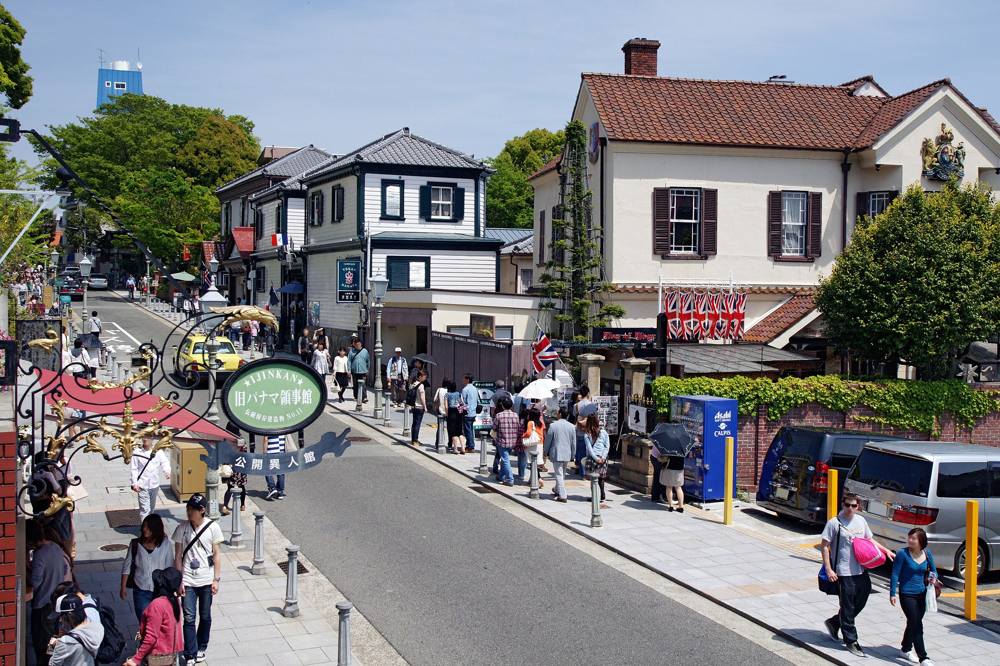

In [ ]:
#Mengambil gambar dari internet dan menyimpannya dengan nama 'test.jpg'
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/0/08/Kitano_Street_Kobe01s5s4110.jpg/2560px-Kitano_Street_Kobe01s5s4110.jpg -O test.jpg
image_path = 'test.jpg'

#menampilkan gambar
with open(image_path, 'rb') as f:
  np_image_string = np.array([f.read()])
  
image = Image.open(image_path)
width, height = image.size
#Menyimpan gambar dalam bentuk array kedalam variabel np_image
np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

display.display(display.Image(image_path, width=1024))

## Create a Tensorflow session


In [ ]:
#Penjelasan ttg TPU vs GPU vs CPU : https://analyticsindiamag.com/tpu-vs-gpu-vs-cpu-which-hardware-should-you-choose-for-deep-learning/

#Jika mau menghilangkan tools param, hapus tanda "@" pada komentar param dibawah
use_tpu = True #@param {type:"boolean"}
if use_tpu: #Mengecek apakah kita akaan menggunakan TPU atau tidak
  import os
  import pprint

  #Jika kita menggunakan TPU, maka sistem akan mengecek apakah disistem kita sudah terkoneksi dengan runtime TPU
  #Jika belum maka akan menampilkan error seperti ini:
  assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'

  #Jika sudah, maka sistem akan mencari Address dari TPU tersebut dan menampilkannya
  TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print('TPU address is', TPU_ADDRESS)

  #Memindahkan session ke TPU (jadi nanti seluruh proses yg menggunakan tensorflow akan dijalankan oleh TPU)
  session = tf.Session(TPU_ADDRESS, graph=tf.Graph())
  #Menampilkan List TPU Devices yang kita punya
  print('TPU devices:')
  pprint.pprint(session.list_devices())
else:
  #Jika kita tidak memakai TPU makan seluruh proses yg menggunakan tensorflow akan dijalankan sesuai dgn runtime yg kita atur
  session = tf.Session(graph=tf.Graph())

TPU address is grpc://10.21.175.234:8470
TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, 5159862974826065271),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 5719530112037224078),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, -9129152454445573636),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 7943672627190610735),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 3845509437491164750),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 7292454544293492881),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, -3139024984582983400),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, -6790566427430326828),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, -371475

# Load the pretrained model


In [ ]:
#Mengambil coco pretained model yg sudah disediakan oleh shapemask
saved_model_dir = 'gs://cloud-tpu-checkpoints/shapemask/1571767330' #@param {type:"string"}
_ = tf.saved_model.loader.load(session, ['serve'], saved_model_dir)

Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.
INFO:tensorflow:Restoring parameters from gs://cloud-tpu-checkpoints/shapemask/1571767330/variables/variables


## Perform instance segmentation and retrieve the predictions



In [ ]:
num_detections, detection_boxes, detection_classes, detection_scores, detection_masks, detection_outer_boxes, image_info = session.run(
    ['NumDetections:0', 'DetectionBoxes:0', 'DetectionClasses:0', 'DetectionScores:0', 'DetectionMasks:0', 'DetectionOuterBoxes:0', 'ImageInfo:0'],
    feed_dict={'Placeholder:0': np_image_string})

num_detections = np.squeeze(num_detections.astype(np.int32), axis=(0,)) #Variabel untuk menyimpan ada berapa jumlah objek yg terdeteksi
detection_boxes = np.squeeze(detection_boxes / min(image_info[0, 2]), axis=(0,))[0:num_detections] 
detection_outer_boxes = np.squeeze(detection_outer_boxes / min(image_info[0, 2]), axis=(0,))[0:num_detections]
detection_scores = np.squeeze(detection_scores, axis=(0,))[0:num_detections] #Variabel untuk menyimpan dan score probability sebuah objek masuk ke sebuah kelas
detection_classes = np.squeeze(detection_classes.astype(np.int32), axis=(0,))[0:num_detections] #Variabel untuk menyimpan kelas dari sebuah objek
instance_masks = np.squeeze(detection_masks, axis=(0,))[0:num_detections] #Varuabel untuk menyimpan hasil instance segmentation
# Use outer boxes 
ymin, xmin, ymax, xmax = np.split(detection_outer_boxes, 4, axis=-1)
processed_boxes = np.concatenate([xmin, ymin, xmax - xmin, ymax - ymin], axis=-1)

#Melakukan proses segemntasi terhadap gambar menggunakan pretained model coco yang telah kita load
segmentations = coco_utils.generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)

In [ ]:
 detection_classes

array([ 1,  1,  1,  1,  1, 28,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1, 28,  3, 31,  1,  1,  1, 27,  1, 31,  8,  1,  1,  8,  1,  1,  1,
        1,  1, 31, 31, 31, 31, 31, 28,  3, 35,  3,  1,  3,  1, 31,  1, 41,
        1,  1,  1,  3, 27,  8,  1,  3,  6,  1,  1,  1,  1,  2,  1, 35, 31,
        1,  1, 31,  1, 10, 31,  1, 31, 28, 31,  1,  3, 41, 41,  1,  1,  1,
        1, 27, 41, 28, 28,  1, 31, 41,  1,  1,  1,  1,  1,  1,  3],
      dtype=int32)

## Visualize the detection results


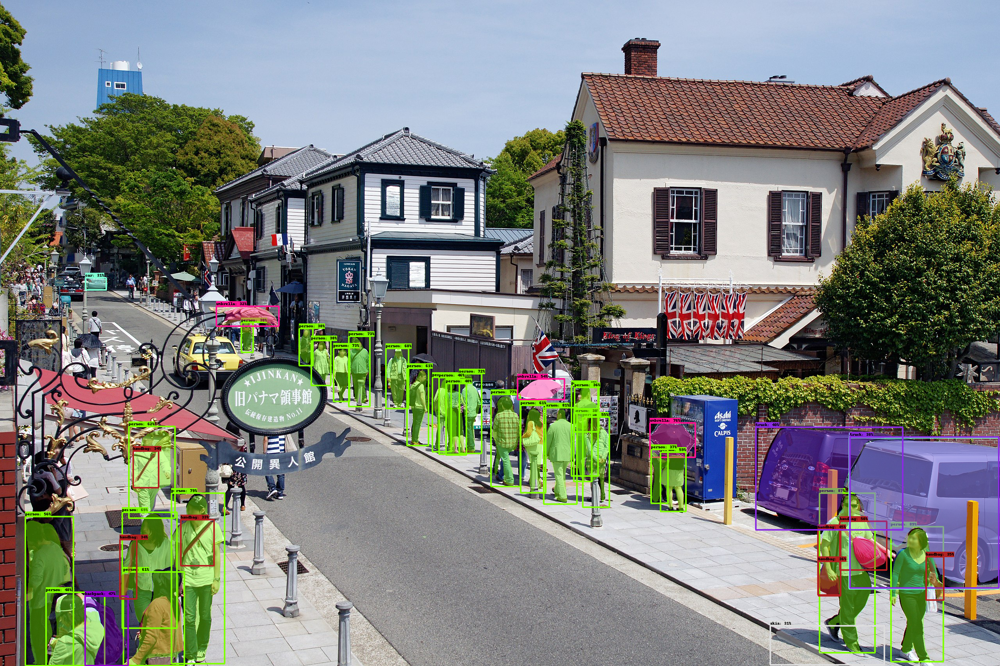

In [ ]:
#Jika mau menghilangkan tools slider, hapus tanda "@" pada komentar param dibawah
max_boxes_to_draw = 44   #@param {type:"integer"}
min_score_thresh = 0.27    #@param {type:"slider", min:0, max:1, step:0.01}

image_with_detections = visualization_utils.visualize_boxes_and_labels_on_image_array(
    np_image * 1,
    detection_boxes,
    detection_classes,
    detection_scores,
    category_index,
    instance_masks=segmentations,
    use_normalized_coordinates=False,
    max_boxes_to_draw=max_boxes_to_draw,
    min_score_thresh=min_score_thresh)

output_image_path = 'test_results.png'
Image.fromarray(image_with_detections.astype(np.uint8)).save(output_image_path)
display.display(display.Image(output_image_path, width=1024))

# Edge Detection menggunakan Sobel Detection

In [ ]:
#Mengambil gambar dari internet dan menyimpannya dengan nama 'test_edge.jpg'
!wget https://learnopencv.com/wp-content/uploads/2021/06/input_image-1.jpg -O test_edge.jpg


--2021-11-09 10:46:37--  https://learnopencv.com/wp-content/uploads/2021/06/input_image-1.jpg
Resolving learnopencv.com (learnopencv.com)... 172.66.41.41, 172.66.42.215, 2606:4700:3108::ac42:2ad7, ...
Connecting to learnopencv.com (learnopencv.com)|172.66.41.41|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 80466 (79K) [image/jpeg]
Saving to: ‘test_edge.jpg’

test_edge.jpg       100%[===================>]  78.58K  --.-KB/s    in 0.01s   

2021-11-09 10:46:37 (7.30 MB/s) - ‘test_edge.jpg’ saved [80466/80466]



Original Image


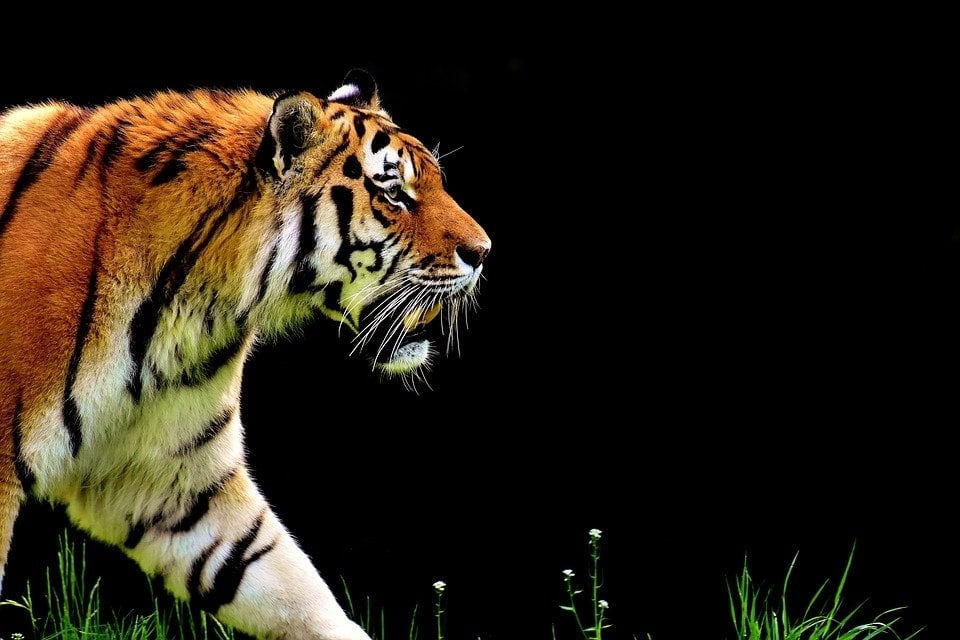

Sobel Edge Detection on the X axis


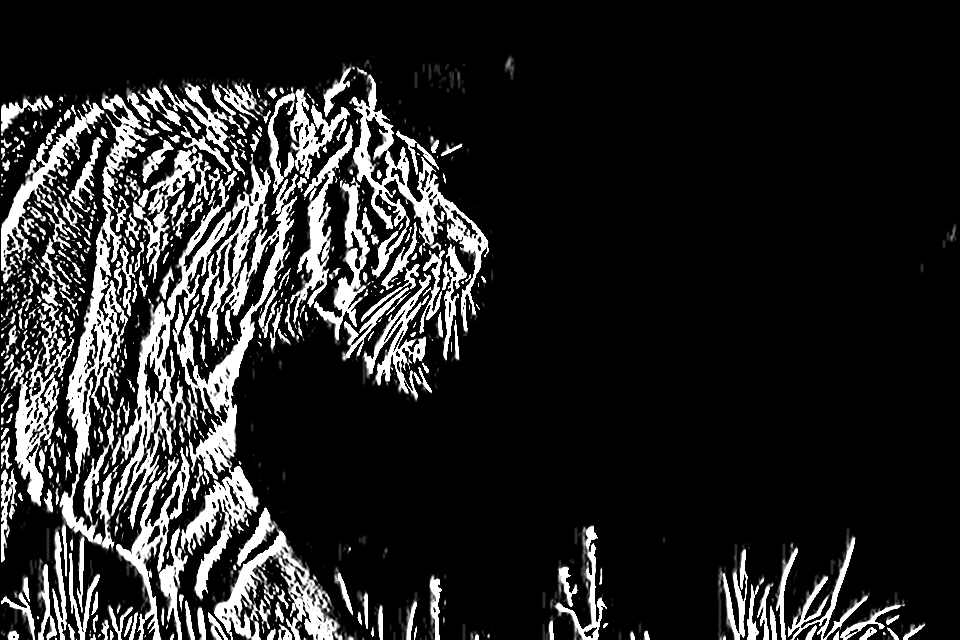

Sobel Edge Detection on the Y axis


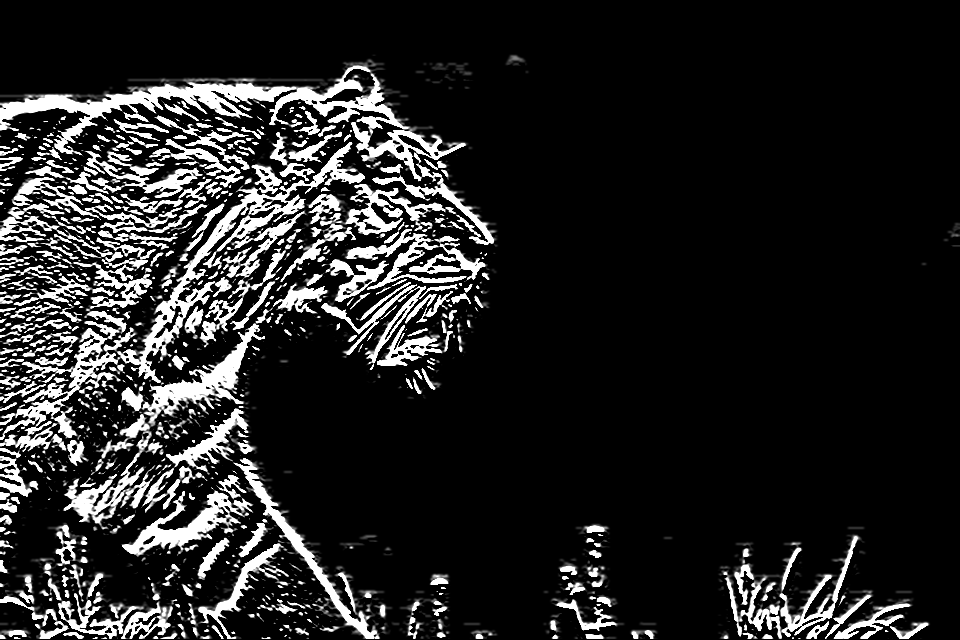

Combined X and Y Sobel Edge Detection


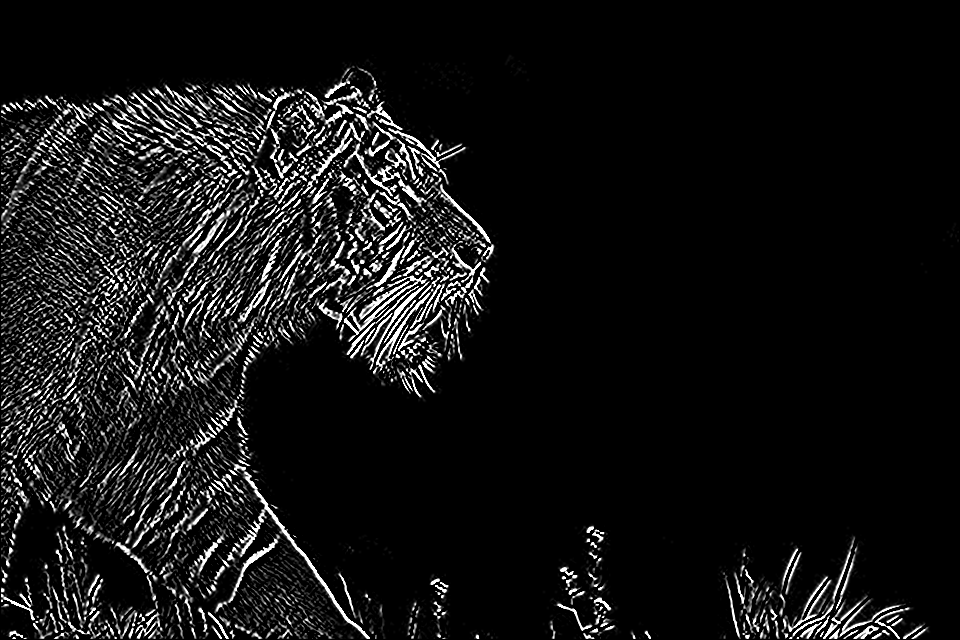

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Read the original image
print('Original Image')
img = cv2.imread('test_edge.jpg')

# Display original image
cv2_imshow(img) #if you're using jupyter notebook replace cv2_imshow with cv2.imshow
cv2.waitKey(0)

# Convert to graycsale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

# Display Sobel Edge Detection Images
print('Sobel Edge Detection on the X axis')
cv2_imshow(sobelx) 
cv2.waitKey(0)
print('Sobel Edge Detection on the Y axis')
cv2_imshow(sobely) 
cv2.waitKey(0)
print('Combined X and Y Sobel Edge Detection')
cv2_imshow(sobelxy) 


